In [1]:
import pandas as  pd 
from rdkit import Chem
from rdkit.Chem import AllChem
import numpy as np
import pandas as pd
 
def generate_fingerprint(smiles, radius=2, nBits=2048):
    mol = Chem.MolFromSmiles(smiles)
    if mol is not None:
        morgan_gen = AllChem.GetMorganGenerator(radius=radius, fpSize=nBits)
        return list(morgan_gen.GetFingerprint(mol))
    return [0] * nBits
dataset = pd.read_csv("dataset/SMRT_dataset_with_dates.csv").sort_values(by='date').reset_index(drop=True)
dataset['fingerprint'] = dataset['SMILES'].apply(lambda x: generate_fingerprint(x)) 

In [ ]:
import joblib
lgbm_model = joblib.load('models/lgbm_chronological_best_model.pkl')
ftest_set = dataset.iloc[int(0.85*dataset.shape[0]):,]
X_ftest = np.array(ftest_set['fingerprint'].tolist())
y_ftest = ftest_set['rt']

## SHAP summary results

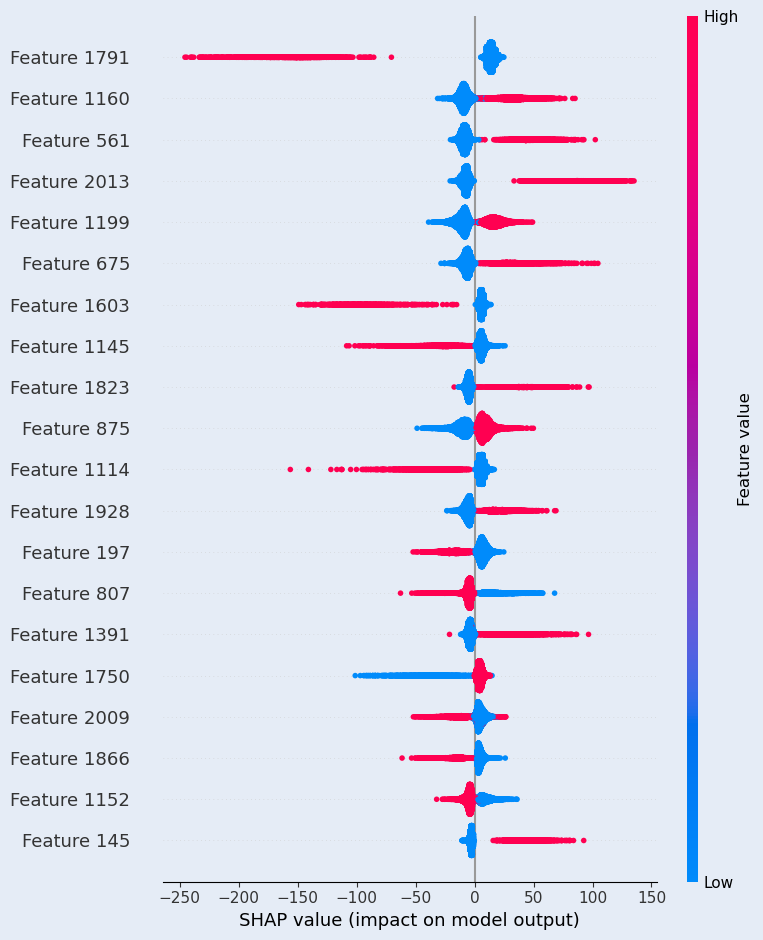

In [5]:
import shap
import matplotlib.pyplot as plt

# Initialize JS visualization for the notebook
shap.initjs()

# Create the explainer
explainer = shap.TreeExplainer(lgbm_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_ftest)

# Create a summary plot
shap.summary_plot(shap_values, X_ftest, show=False)

# Customize background color
fig = plt.gcf()
ax = plt.gca()
bg_color = (229/255, 236/255, 246/255, 1)
fig.patch.set_facecolor(bg_color)
ax.set_facecolor(bg_color)

plt.show()

## Mean Absolute SHAP Value

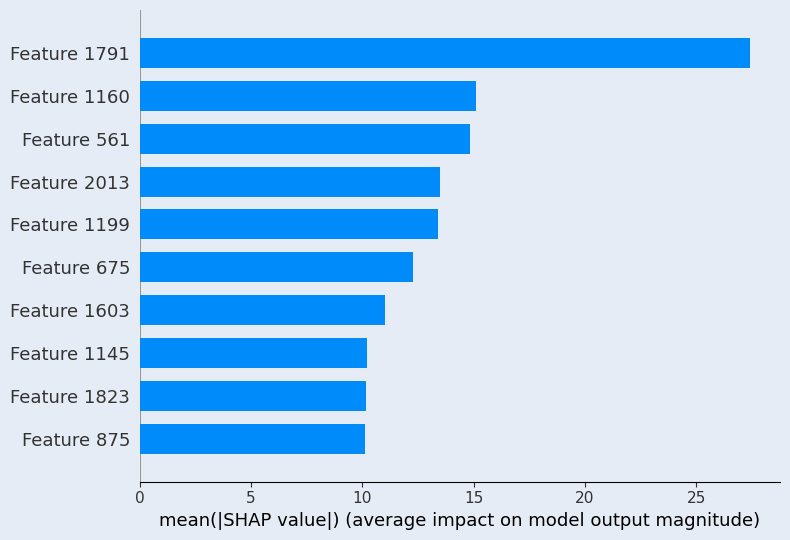

In [31]:
# Customize background color
# Use summary_plot with plot_type="bar" for numpy array shap_values
shap.summary_plot(shap_values, X_ftest, plot_type="bar", max_display=10, show=False)
fig = plt.gcf()
ax = plt.gca()
bg_color = (229/255, 236/255, 246/255, 1)
fig.patch.set_facecolor(bg_color)
ax.set_facecolor(bg_color)

plt.show()

## Feature importance by the built-in method of LGBM

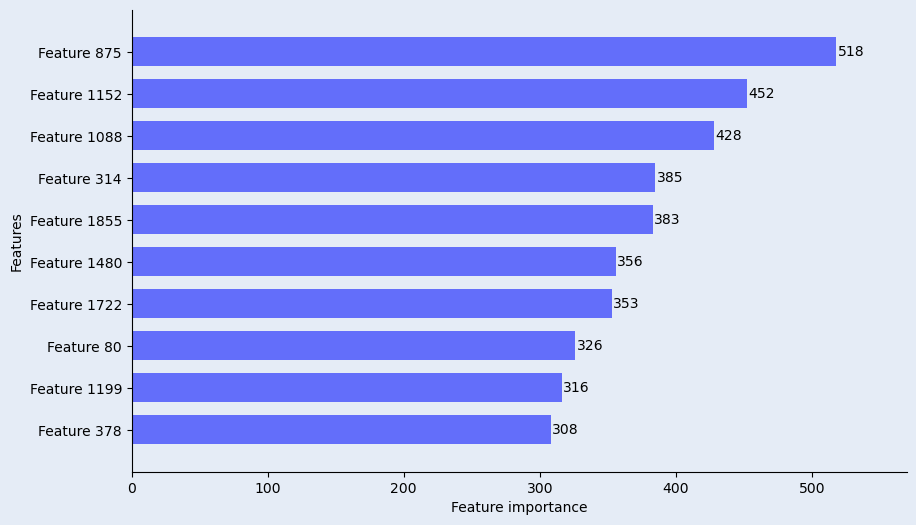

In [37]:
import lightgbm as lgb
import matplotlib.pyplot as plt

# Plot feature importance using LightGBM's built-in method
ax = lgb.plot_importance(lgbm_model, max_num_features=10, figsize=(10, 6), grid=False, color='#636EFA', height=0.7, title=None)

# Customize background color
bg_color = (229/255, 236/255, 246/255, 1)
fig = plt.gcf()
fig.patch.set_facecolor(bg_color)
ax.set_facecolor(bg_color)

# Remove top and right spines to match SHAP style
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Customize Y-axis labels to "Feature X"
# Get current labels and format them
current_labels = [item.get_text() for item in ax.get_yticklabels()]
new_labels = []
for label in current_labels:
    # Extract numbers from the label (e.g., "Column_875" -> "875")
    digits = ''.join(filter(str.isdigit, label))
    if digits:
        new_labels.append(f"Feature {digits}")
    else:
        new_labels.append(label)
ax.set_yticklabels(new_labels)

plt.show()

## SHAP Interpretation for single molecule

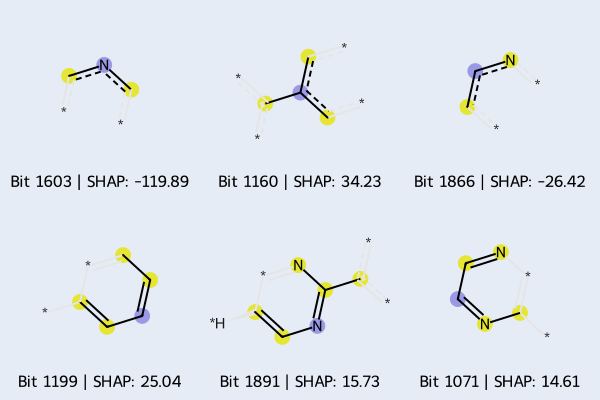

In [26]:
from rdkit.Chem import Draw
from IPython.display import display, SVG
import re

def visualize_top_bits(smiles, shap_values_row, num_bits=6, radius=2, nBits=2048):
    mol = Chem.MolFromSmiles(smiles)
    if not mol: return
    morgan_gen = AllChem.GetMorganGenerator(radius=radius, fpSize=nBits)
    ao = AllChem.AdditionalOutput()
    ao.CollectBitInfoMap()
    fp = morgan_gen.GetFingerprint(mol, additionalOutput=ao)
    # Get indices of bits that are ON (1)
    on_bits = list(fp.GetOnBits())
    # Get bit info map
    bi = ao.GetBitInfoMap()
    
    # Filter SHAP values for these bits
    relevant_shap = {bit: shap_values_row[bit] for bit in on_bits}
    
    # Sort by absolute SHAP value
    top_bits = sorted(relevant_shap.keys(), key=lambda x: abs(relevant_shap[x]), reverse=True)[:num_bits]
    
    # Prepare data for drawing
    bits_to_draw = [(mol, bit, bi) for bit in top_bits]
    legends = [f"Bit {bit} | SHAP: {relevant_shap[bit]:.2f}" for bit in top_bits]
    
    if not bits_to_draw:
        print("No bits to visualize.")
        return

    # Draw grid
    # DrawMorganBits might return a string or an SVG object depending on RDKit version
    svg_output = Draw.DrawMorganBits(bits_to_draw, molsPerRow=min(len(bits_to_draw), 3), subImgSize=(200, 200), legends=legends, useSVG=True)
    
    # Extract string data if it's an SVG object
    if hasattr(svg_output, 'data'):
        svg_data = svg_output.data
    else:
        svg_data = svg_output

    # Change background color
    # rgba(229, 236, 246, 1) converts to hex #E5ECF6
    if isinstance(svg_data, str):
        # 1. Replace existing white fills/rects with the target color
        svg_data = re.sub(r'fill:\s*#ffffff', 'fill:#E5ECF6', svg_data, flags=re.IGNORECASE)
        svg_data = re.sub(r'fill:\s*white', 'fill:#E5ECF6', svg_data, flags=re.IGNORECASE)
        svg_data = re.sub(r'rect style="opacity:1.0;fill:\s*#ffffff;stroke:none"', 'rect style="opacity:1.0;fill:#E5ECF6;stroke:none"', svg_data, flags=re.IGNORECASE)
        
        # 2. Inject a global background rect to cover the entire image
        # This ensures that even if RDKit doesn't draw background rects for all sub-plots, the whole image has the color.
        bg_rect = '<rect width="100%" height="100%" fill="#E5ECF6"/>'
        
        if "<!-- END OF HEADER -->" in svg_data:
            svg_data = svg_data.replace("<!-- END OF HEADER -->", f"<!-- END OF HEADER -->\n{bg_rect}")
        else:
            # Fallback: insert after the opening svg tag
            svg_data = re.sub(r'(<svg[^>]*>)', lambda m: m.group(1) + f'\n{bg_rect}', svg_data, count=1)
    
    display(SVG(svg_data))

# Visualize for the first molecule in the test set
mol_id = 1
visualize_top_bits(ftest_set.iloc[mol_id]['SMILES'], shap_values[mol_id])

# blue: the central atom in the environment
# yellow: aromatic atoms
# gray: aliphatic ring atoms

## SHAP for individual features

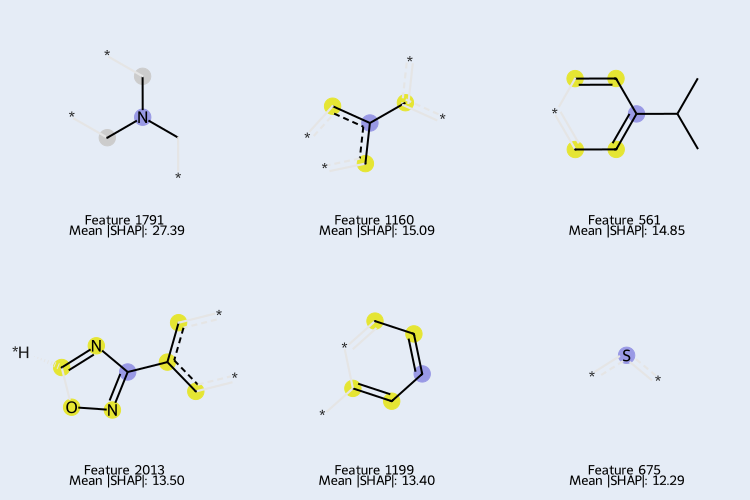

In [42]:
# Identify top features based on mean absolute SHAP value across the test set
mean_abs_shap = np.abs(shap_values).mean(axis=0)
top_features = np.argsort(mean_abs_shap)[::-1][:6]  # Top 6 features

bits_to_draw = []
legends = []

for bit_idx in top_features:
    # Find samples in the test set where this bit is present (value == 1)
    sample_indices = np.where(X_ftest[:, bit_idx] == 1)[0]
    
    if len(sample_indices) > 0:
        # Pick the molecule where this feature has the highest impact (highest absolute SHAP value)
        # This ensures we visualize the feature in a relevant context
        best_sample_idx = sample_indices[np.argmax(np.abs(shap_values[sample_indices, bit_idx]))]
        
        smiles = ftest_set.iloc[best_sample_idx]['SMILES']
        mol = Chem.MolFromSmiles(smiles)
        
        # Regenerate bit info for this specific molecule to draw the bit
        morgan_gen = AllChem.GetMorganGenerator(radius=2, fpSize=2048)
        ao = AllChem.AdditionalOutput()
        ao.CollectBitInfoMap()
        _ = morgan_gen.GetFingerprint(mol, additionalOutput=ao)
        bi = ao.GetBitInfoMap()
        
        bits_to_draw.append((mol, int(bit_idx), bi))
        legends.append(f"Feature {bit_idx}\n Mean |SHAP|: {mean_abs_shap[bit_idx]:.2f}")

if bits_to_draw:
    # Draw grid
    svg_output = Draw.DrawMorganBits(bits_to_draw, molsPerRow=3, subImgSize=(250, 250), legends=legends, useSVG=True)

    # Extract string data
    if hasattr(svg_output, 'data'):
        svg_data = svg_output.data
    else:
        svg_data = svg_output

    # Apply background color style (consistent with previous plots)
    if isinstance(svg_data, str):
        # Replace existing white fills
        svg_data = re.sub(r'fill:\s*#ffffff', 'fill:#E5ECF6', svg_data, flags=re.IGNORECASE)
        svg_data = re.sub(r'fill:\s*white', 'fill:#E5ECF6', svg_data, flags=re.IGNORECASE)
        svg_data = re.sub(r'rect style="opacity:1.0;fill:\s*#ffffff;stroke:none"', 'rect style="opacity:1.0;fill:#E5ECF6;stroke:none"', svg_data, flags=re.IGNORECASE)
        
        # Inject global background rect
        bg_rect = '<rect width="100%" height="100%" fill="#E5ECF6"/>'
        if "<!-- END OF HEADER -->" in svg_data:
            svg_data = svg_data.replace("<!-- END OF HEADER -->", f"<!-- END OF HEADER -->\n{bg_rect}")
        else:
            svg_data = re.sub(r'(<svg[^>]*>)', lambda m: m.group(1) + f'\n{bg_rect}', svg_data, count=1)

    display(SVG(svg_data))
else:
    print("No features found to visualize.")

# Captum with GCN for interpretation

In [55]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
from pyg_chemprop_utils import smiles2data,initialize_weights
from pyg_chemprop import GCNEncoder,train,make_prediction
from torch_geometric.loader import DataLoader
import torch

import pandas as pd 

dataset = pd.read_csv("dataset/SMRT_dataset_with_dates.csv").sort_values(by='date').reset_index(drop=True)
dataset_clean = dataset.iloc[:int(0.85*dataset.shape[0]),:]
ftest_set = dataset.iloc[int(0.85*dataset.shape[0]):,]
train_set,valid_set = dataset_clean.iloc[:int(0.824*dataset_clean.shape[0]),:], dataset_clean.iloc[int(0.824*dataset_clean.shape[0]):,:]
# Build graph dataset from train/valid splits
smiles_col = "SMILES"  # change if your column name differs
rt_col = "rt"          # change if your column name differs

train_graphs = []
for _, row in train_set.iterrows():
    data = smiles2data(row[smiles_col])
    data['y'] = row[rt_col]
    if data is not None:
        train_graphs.append(data)

valid_graphs = []
for _, row in valid_set.iterrows():
    data = smiles2data(row[smiles_col])
    data['y'] = row[rt_col]
    if data is not None:
        valid_graphs.append(data)

ftest_graphs = []
for _, row in ftest_set.iterrows():
    data = smiles2data(row[smiles_col])
    data['y'] = row[rt_col]
    if data is not None:
        ftest_graphs.append(data)
len(train_graphs), len(valid_graphs), len(ftest_graphs)

(56058, 11974, 12006)

In [64]:
batch_size=128
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_graphs, batch_size=batch_size, shuffle=False)
ftest_loader = DataLoader(ftest_graphs, batch_size=batch_size, shuffle=False)

In [62]:
gcn_model = torch.load('checkpoints/GCN_chronological_best_model.pt', weights_only=False,map_location=torch.device('cpu'))

In [65]:
# Create config dictionary as expected by make_prediction
config = {"model": gcn_model}

# Make predictions
y_pred_tensor, y_true_tensor = make_prediction(config, ftest_loader, device=torch.device('cpu'))

# Convert to numpy
y_pred = y_pred_tensor.numpy()
y_true = y_true_tensor.numpy()

# Calculate metrics
mse = mean_squared_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f"MSE: {mse:.4f}")
print(f"R2 Score: {r2:.4f}")

100%|██████████| 94/94 [00:03<00:00, 26.79it/s]

MSE: 7866.2441
R2 Score: 0.8188


In [95]:
import networkx as nx
import numpy as np
from rdkit import Chem
from torch_geometric.utils import to_networkx


def draw_molecule(g, edge_mask=None, draw_edge_labels=False):
    g = g.copy().to_undirected()
    node_labels = {}
    for u, data in g.nodes(data=True):
        node_labels[u] = data['name']
    pos = nx.planar_layout(g)
    pos = nx.spring_layout(g, pos=pos)
    if edge_mask is None:
        edge_color = 'black'
        widths = None
    else:
        edge_color = [edge_mask[(u, v)] for u, v in g.edges()]
        widths = [x * 10 for x in edge_color]
    nx.draw(g, pos=pos, labels=node_labels, width=widths,
            edge_color=edge_color, edge_cmap=plt.cm.Blues,
            node_color='azure')
    
    if draw_edge_labels and edge_mask is not None:
        edge_labels = {k: ('%.2f' % v) for k, v in edge_mask.items()}    
        nx.draw_networkx_edge_labels(g, pos, edge_labels=edge_labels,
                                    font_color='red')
    plt.show()


def get_atomic_symbol(atomic_number):
    # Get the periodic table
    pt = Chem.GetPeriodicTable()
    symbol = pt.GetElementSymbol(atomic_number)
    return symbol

def to_molecule(data):
    g = to_networkx(data, node_attrs=['x'])
    for u, data in g.nodes(data=True):
        data['name'] = get_atomic_symbol(data['x'][:100].index(1.0)+1)
        del data['x']
    return g


In [ ]:
from captum.attr import Saliency, IntegratedGradients
device  = torch.device('cpu')
def model_forward(edge_mask, data):
    
    batch = torch.zeros(data.x.shape[0], dtype=int).to(device)
    #out = gcn_model(data.x, data.edge_index, batch, edge_mask)
    out = gcn_model(data)

    return out


def explain(method, data, target=0):
    input_mask = torch.ones(data.edge_index.shape[1]).requires_grad_(True).to(device)
    if method == 'ig':
        ig = IntegratedGradients(model_forward)
        mask = ig.attribute(input_mask, target=target,
                            additional_forward_args=(data,),
                            internal_batch_size=data.edge_index.shape[1])
    elif method == 'saliency':
        saliency = Saliency(model_forward)
        mask = saliency.attribute(input_mask, target=target,
                                  additional_forward_args=(data,))
    else:
        raise Exception('Unknown explanation method')

    edge_mask = np.abs(mask.cpu().detach().numpy())
    if edge_mask.max() > 0:  # avoid division by zero
        edge_mask = edge_mask / edge_mask.max()
    return edge_mask

In [94]:
to_molecule(data)

In [ ]:
import random
from collections import defaultdict

def aggregate_edge_directions(edge_mask, data):
    edge_mask_dict = defaultdict(float)
    for val, u, v in list(zip(edge_mask, *data.edge_index)):
        u, v = u.item(), v.item()
        if u > v:
            u, v = v, u
        edge_mask_dict[(u, v)] += val
    return edge_mask_dict


data = random.choice(ftest_graphs)
mol = to_molecule(data)

for title, method in [('Integrated Gradients', 'ig'), ('Saliency', 'saliency')]:
    edge_mask = explain(method, data, target=0)
    edge_mask_dict = aggregate_edge_directions(edge_mask, data)
    plt.figure(figsize=(10, 5))
    plt.title(title)
    draw_molecule(mol, edge_mask_dict)

In [ ]:
## Gemini captum

In [ ]:
from captum.attr import IntegratedGradients
from rdkit.Chem.Draw import SimilarityMaps
import matplotlib.pyplot as plt
from torch_geometric.data import Data
import torch.nn as nn
from pyg_chemprop_utils import mol2data

# Wrapper for Captum to handle PyG Data object
class GCNWrapper(nn.Module):
    def __init__(self, model):
        super(GCNWrapper, self).__init__()
        self.model = model

    def forward(self, x, edge_index, batch):
        # Reconstruct Data object
        data = Data(x=x, edge_index=edge_index, batch=batch)
        return self.model(data)

def visualize_captum_explanation(smiles, model, title=""):
    # 1. Prepare Data
    mol = Chem.MolFromSmiles(smiles)
    if not mol: return
    mol_with_h = Chem.AddHs(mol)
    data = mol2data(mol)
    
    # 2. Prepare Inputs
    x = data.x.clone().detach().requires_grad_(True)
    edge_index = data.edge_index
    batch = torch.zeros(x.shape[0], dtype=torch.long)
    
    # 3. Calculate Attribution
    wrapper = GCNWrapper(model)
    ig = IntegratedGradients(wrapper)
    
    # Attribute
    attr, delta = ig.attribute(x, additional_forward_args=(x,edge_index,batch), return_convergence_delta=True)
    
    # 4. Aggregate weights (Sum across features)
    atom_weights_all = attr.sum(dim=1).detach().numpy()
    
    # 5. Aggregate H attributions to heavy atoms
    weights = []
    num_heavy_atoms = mol.GetNumAtoms()
    
    # RDKit AddHs preserves the order of heavy atoms as the first N atoms
    for i in range(num_heavy_atoms):
        w = atom_weights_all[i]
        atom = mol_with_h.GetAtomWithIdx(i)
        # Add weights of H neighbors
        for neighbor in atom.GetNeighbors():
            if neighbor.GetAtomicNum() == 1:
                w += atom_weights_all[neighbor.GetIdx()]
        weights.append(w)
        
    # 6. Visualize
    # Use SimilarityMaps to draw the molecule with weights
    # We use the original mol (without Hs) and the aggregated weights
    fig = SimilarityMaps.GetSimilarityMapFromWeights(mol, weights, colorMap='coolwarm', alpha=0.5, contourLines=0)
    
    # Apply consistent background style
    bg_color = (229/255, 236/255, 246/255, 1)
    fig.patch.set_facecolor(bg_color)
    ax = plt.gca()
    ax.set_facecolor(bg_color)
    ax.axis('off') # Hide axes
    
    if title:
        plt.title(title)
    
    plt.show()

# Visualize Best Prediction
print(f"--- Best Prediction (Index: {best_idx}) ---")
visualize_captum_explanation(ftest_set.iloc[best_idx]['SMILES'], gcn_model, title="GCN Interpretation: Best Prediction")

print("\n" + "="*80 + "\n")

# Visualize Worst Prediction
print(f"--- Worst Prediction (Index: {worst_idx}) ---")
visualize_captum_explanation(ftest_set.iloc[worst_idx]['SMILES'], gcn_model, title="GCN Interpretation: Worst Prediction")

# Why model fail

## identify a good prediction and a bad prediction and visualize their shap feature contribution

--- Best Prediction (Index: 11968) ---
SMILES: O=C(CC1CC1)N1CC(F)(F)C[C@H]1c1nnc(-c2ccccc2)o1
Actual RT: 803.70, Predicted RT: 803.70, Error: 0.0002


/Users/kai/miniforge3/envs/tutorial/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


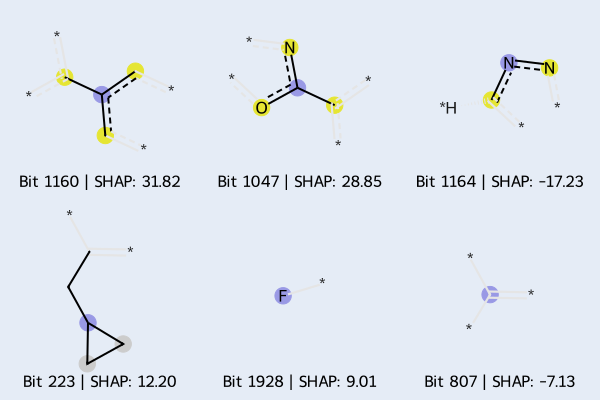



--- Worst Prediction (Index: 9251) ---
SMILES: CCOc1ccc(CNc2nc3ccccc3n2CCN(CC)CC)cc1
Actual RT: 1303.10, Predicted RT: 355.05, Error: 948.0533


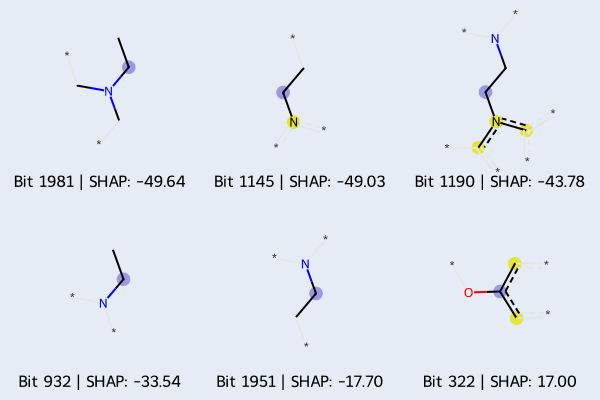

In [43]:
# Calculate predictions
y_pred = lgbm_model.predict(X_ftest)
errors = np.abs(y_ftest.values - y_pred)

# Find index of best (min error) and worst (max error) predictions
best_idx = np.argmin(errors)
worst_idx = np.argmax(errors)

# Visualize Best Prediction
print(f"--- Best Prediction (Index: {best_idx}) ---")
print(f"SMILES: {ftest_set.iloc[best_idx]['SMILES']}")
print(f"Actual RT: {y_ftest.iloc[best_idx]:.2f}, Predicted RT: {y_pred[best_idx]:.2f}, Error: {errors[best_idx]:.4f}")
visualize_top_bits(ftest_set.iloc[best_idx]['SMILES'], shap_values[best_idx])

print("\n" + "="*80 + "\n")

# Visualize Worst Prediction
print(f"--- Worst Prediction (Index: {worst_idx}) ---")
print(f"SMILES: {ftest_set.iloc[worst_idx]['SMILES']}")
print(f"Actual RT: {y_ftest.iloc[worst_idx]:.2f}, Predicted RT: {y_pred[worst_idx]:.2f}, Error: {errors[worst_idx]:.4f}")
visualize_top_bits(ftest_set.iloc[worst_idx]['SMILES'], shap_values[worst_idx])

# counting the frequency of the bits in training datasets

In [56]:
# counting the frequency of the bits in training datasets
import plotly.express as px

dataset_clean = dataset.iloc[:int(0.85*dataset.shape[0]),:]
train_set = dataset_clean.iloc[:int(0.824*dataset_clean.shape[0]),:]
X_train = np.array(train_set['fingerprint'].tolist())
y_train = train_set['rt']

def get_top_bits_indices(shap_values_row, fingerprint_row, num_bits=6):
    # Get indices of bits that are ON (1)
    on_bits = np.where(fingerprint_row == 1)[0]
    # Filter SHAP values for these bits
    relevant_shap = {bit: shap_values_row[bit] for bit in on_bits}
    # Sort by absolute SHAP value
    top_bits = sorted(relevant_shap.keys(), key=lambda x: abs(relevant_shap[x]), reverse=True)[:num_bits]
    return top_bits

# Get top bits
top_bits_best = get_top_bits_indices(shap_values[best_idx], X_ftest[best_idx])
top_bits_worst = get_top_bits_indices(shap_values[worst_idx], X_ftest[worst_idx])

# Prepare data for Plotly
data = []
for bit in top_bits_best:
    ratio = X_train[:, bit].mean()
    data.append({'Bit': f'Bit {bit}', 'Frequency': ratio, 'Prediction': 'Best Prediction'})

for bit in top_bits_worst:
    ratio = X_train[:, bit].mean()
    data.append({'Bit': f'Bit {bit}', 'Frequency': ratio, 'Prediction': 'Worst Prediction'})

df_counts = pd.DataFrame(data)

# Create grouped bar plot
fig = px.bar(df_counts, x='Bit', y='Frequency', color='Prediction', barmode='group',
             color_discrete_map={'Best Prediction': '#636EFA', 'Worst Prediction': '#EF553B'})

# Apply consistent styling
fig.update_layout(
    plot_bgcolor='rgba(229, 236, 246, 1)',
    paper_bgcolor='rgba(229, 236, 246, 1)',
    margin=dict(l=20, r=20, t=40, b=20),
    yaxis_tickformat='.1%',
    xaxis_title="Top SHAP Bits",
    yaxis_title="Frequency in Training Set",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5
    ),
)

fig.show()

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

## Similarity and MCS visualization between best and worst predicted molecules

--- Most Similar to Best Prediction ---
Query SMILES: O=C(CC1CC1)N1CC(F)(F)C[C@H]1c1nnc(-c2ccccc2)o1


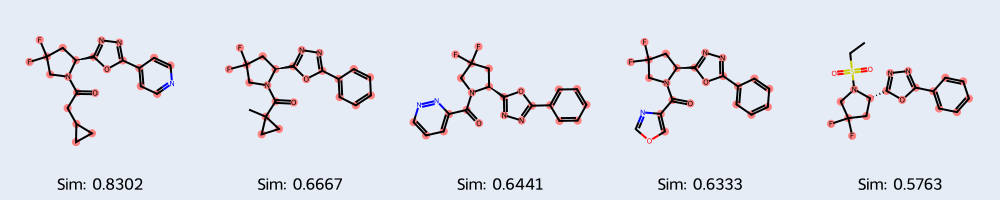



--- Most Similar to Worst Prediction ---
Query SMILES: CCOc1ccc(CNc2nc3ccccc3n2CCN(CC)CC)cc1


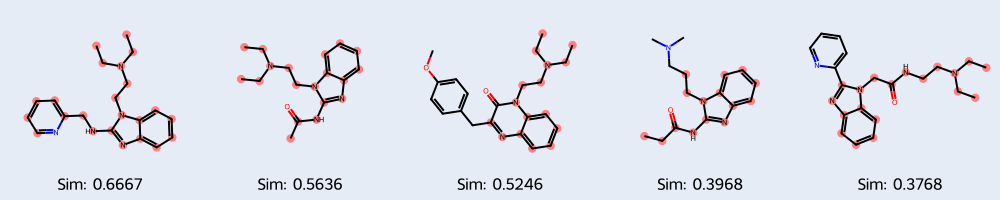

In [54]:
from rdkit.Chem import rdFMCS

def find_and_visualize_similar_mols(query_smiles, train_df, X_train_fp, n_similar=5, title_prefix=""):
    query_mol = Chem.MolFromSmiles(query_smiles)
    if not query_mol: return
    
    # Generate query fingerprint vector
    query_fp_list = generate_fingerprint(query_smiles)
    query_fp_arr = np.array(query_fp_list)
    
    # Calculate Tanimoto similarity using numpy for speed
    # T(A, B) = (A . B) / (sum(A) + sum(B) - A . B)
    intersection = np.dot(X_train_fp, query_fp_arr)
    sum_train = np.sum(X_train_fp, axis=1)
    sum_query = np.sum(query_fp_arr)
    union = sum_train + sum_query - intersection
    
    # Avoid division by zero
    tanimoto_scores = np.divide(intersection, union, out=np.zeros_like(intersection, dtype=float), where=union!=0)
    
    # Get top N indices
    top_indices = np.argsort(tanimoto_scores)[::-1][:n_similar]
    
    mols_to_draw = []
    legends = []
    highlight_lists = []
    
    for idx in top_indices:
        score = tanimoto_scores[idx]
        target_smiles = train_df.iloc[idx]['SMILES']
        target_mol = Chem.MolFromSmiles(target_smiles)
        
        if target_mol:
            # Find Maximum Common Substructure (MCS)
            res = rdFMCS.FindMCS([query_mol, target_mol])
            if res.numAtoms > 0:
                mcs_mol = Chem.MolFromSmarts(res.smartsString)
                match = target_mol.GetSubstructMatch(mcs_mol)
                highlight_lists.append(list(match))
            else:
                highlight_lists.append([])
            
            mols_to_draw.append(target_mol)
            legends.append(f"Sim: {score:.4f}")
        
    if mols_to_draw:
        # Draw grid
        svg_output = Draw.MolsToGridImage(mols_to_draw, molsPerRow=n_similar, subImgSize=(200, 200), 
                                          legends=legends, highlightAtomLists=highlight_lists, useSVG=True)
        
        # Apply background color style
        if hasattr(svg_output, 'data'):
            svg_data = svg_output.data
        else:
            svg_data = svg_output
        if isinstance(svg_data, str):
            # Replace existing white fills
            svg_data = re.sub(r'fill:\s*#ffffff', 'fill:#E5ECF6', svg_data, flags=re.IGNORECASE)
            svg_data = re.sub(r'fill:\s*white', 'fill:#E5ECF6', svg_data, flags=re.IGNORECASE)
            svg_data = re.sub(r'rect style="opacity:1.0;fill:\s*#ffffff;stroke:none"', 'rect style="opacity:1.0;fill:#E5ECF6;stroke:none"', svg_data, flags=re.IGNORECASE)
            
            # Inject global background rect
            bg_rect = '<rect width="100%" height="100%" fill="#E5ECF6"/>'
            if "<!-- END OF HEADER -->" in svg_data:
                svg_data = svg_data.replace("<!-- END OF HEADER -->", f"<!-- END OF HEADER -->\n{bg_rect}")
            else:
                svg_data = re.sub(r'(<svg[^>]*>)', lambda m: m.group(1) + f'\n{bg_rect}', svg_data, count=1)
                
        print(f"--- {title_prefix} ---")
        print(f"Query SMILES: {query_smiles}")
        display(SVG(svg_data))

# Visualize for Best Prediction
find_and_visualize_similar_mols(ftest_set.iloc[best_idx]['SMILES'], train_set, X_train, title_prefix="Most Similar to Best Prediction")

print("\n" + "="*80 + "\n")

# Visualize for Worst Prediction
find_and_visualize_similar_mols(ftest_set.iloc[worst_idx]['SMILES'], train_set, X_train, title_prefix="Most Similar to Worst Prediction")

# do the same use captum

In [107]:
import re
import numpy as np
import torch
import matplotlib.pyplot as plt
import networkx as nx
from IPython.display import SVG, display
from captum.attr import IntegratedGradients, Saliency, FeatureAblation
from rdkit import Chem
from rdkit.Chem.Draw import SimilarityMaps, rdMolDraw2D
from torch_geometric.data import Data
from torch_geometric.utils import to_networkx, add_self_loops

BG_RGBA = (229 / 255, 236 / 255, 246 / 255, 1)  # #E5ECF6
BG_HEX = "#0267F5" # "#E5ECF6"


def _style_mpl_ax(ax=None):
    if ax is None:
        ax = plt.gca()
    fig = ax.figure
    fig.patch.set_facecolor(BG_RGBA)
    ax.set_facecolor(BG_RGBA)
    ax.axis("off")
    return ax


def _display_similarity_map_from_weights(
    mol,
    weights,
    title: str = "",
    size=(320, 320),
    color_map=None,
    alpha: float = 0.5,
    contour_lines: int = 0,
    bg_hex: str = BG_HEX,
    bg_rgba=BG_RGBA,
    ):
    """Compatibility wrapper for RDKit SimilarityMaps across versions.

    Some RDKit builds require a positional `draw2d` argument. Newer builds return a Matplotlib figure.
    This function supports both and enforces the notebook's background color.
    """
    if color_map is None:
        color_map = plt.cm.coolwarm

    # Newer RDKit: draw2d is optional, returns a matplotlib figure
    try:
        fig = SimilarityMaps.GetSimilarityMapFromWeights(
            mol,
            weights,
            colorMap=color_map,
            alpha=alpha,
            contourLines=contour_lines,
        )
        ax = plt.gca()
        fig.patch.set_facecolor(bg_rgba)
        ax.set_facecolor(bg_rgba)
        ax.axis("off")
        if title:
            plt.title(title)
        plt.show()
        return fig
    except TypeError:
        # Older RDKit: requires draw2d positional arg
        if title:
            print(title)
        drawer = rdMolDraw2D.MolDraw2DSVG(int(size[0]), int(size[1]))
        SimilarityMaps.GetSimilarityMapFromWeights(
            mol,
            weights,
            drawer,
            colorMap=color_map,
            alpha=alpha,
            contourLines=contour_lines,
        )
        drawer.FinishDrawing()
        svg = drawer.GetDrawingText()
        bg_rect = f'<rect width="100%" height="100%" fill="{bg_hex}"/>'
        svg = re.sub(r"(<svg[^>]*>)", r"\1\n" + bg_rect, svg, count=1)
        display(SVG(svg))
        return svg


def _get_atomic_symbol(atomic_number: int) -> str:
    pt = Chem.GetPeriodicTable()
    return pt.GetElementSymbol(int(atomic_number))


def _node_labels_from_x(x: torch.Tensor):
    """Best-effort atom label extraction from one-hot-ish x."""
    # Your earlier code assumes the first 100 dims encode atomic number one-hot.
    x_np = x.detach().cpu().numpy()
    labels = {}
    for i in range(x_np.shape[0]):
        row = x_np[i]
        idx = None
        for j in range(min(100, row.shape[0])):
            if row[j] == 1.0:
                idx = j
                break
        if idx is None:
            labels[i] = str(i)
        else:
            labels[i] = _get_atomic_symbol(idx + 1)
    return labels


def _smiles_to_data_best_effort(smiles: str, device: torch.device):
    """Try to build a PyG Data that matches the trained model's featurization."""
    from pyg_chemprop_utils import smiles2data
    last_err = None
    for explicit_h in (False, True):
        try:
            data = smiles2data(smiles, explicit_h=explicit_h)
            if data is None:
                raise ValueError("smiles2data returned None")
            data = data.to(device)
            return data, explicit_h
        except Exception as e:
            last_err = e
            continue
    raise RuntimeError(f"Failed to featurize SMILES with explicit_h False/True: {last_err}")


def _predict_single(model, data: Data, device: torch.device) -> float:
    model = model.to(device)
    model.eval()
    if getattr(data, "batch", None) is None:
        data.batch = torch.zeros(data.x.size(0), dtype=torch.long, device=device)
    with torch.no_grad():
        out = model(data)
        out = out.squeeze()
        return float(out.reshape(-1)[0].item())


def explain_gcn_nodes_captum(
    model,
    smiles: str,
    device: torch.device = torch.device("cpu"),
    method: str = "ig",
    n_steps: int = 64,
    title: str = "",
    ):
    """Node-feature attribution (IG or Saliency) visualized with RDKit SimilarityMaps.

    Captum's IG expands `x` along dim=0 (steps batching). We replicate `edge_index`
    with node-index offsets and build a matching `batch` vector.
    """
    model = model.to(device)
    model.eval()

    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        raise ValueError("Invalid SMILES")

    data, explicit_h_used = _smiles_to_data_best_effort(smiles, device)
    x0 = data.x.detach().clone().requires_grad_(True)
    edge_index0 = data.edge_index
    num_nodes = x0.size(0)

    def forward_on_x(x_in: torch.Tensor) -> torch.Tensor:
        if x_in.dim() != 2:
            raise ValueError(f"Expected x_in to be 2D [*, F], got {tuple(x_in.shape)}")
        total_nodes = x_in.size(0)
        if total_nodes % num_nodes != 0:
            raise ValueError(
                f"x_in first dim ({total_nodes}) not divisible by num_nodes ({num_nodes})."
            )
        num_graphs = total_nodes // num_nodes

        if num_graphs == 1:
            batch = torch.zeros(num_nodes, dtype=torch.long, device=device)
            edge_index = edge_index0
        else:
            edge_index = torch.cat(
                [edge_index0 + i * num_nodes for i in range(num_graphs)], dim=1
            )
            batch = torch.arange(num_graphs, device=device).repeat_interleave(num_nodes)

        g = Data(x=x_in, edge_index=edge_index, batch=batch)
        out = model(g).squeeze().reshape(-1)
        return out

    pred = _predict_single(model, data, device)

    m = method.lower().strip()
    if m == "ig":
        explainer = IntegratedGradients(forward_on_x)
        baseline = torch.zeros_like(x0)
        attr = explainer.attribute(x0, baselines=baseline, n_steps=n_steps)
    elif m == "saliency":
        explainer = Saliency(forward_on_x)
        attr = explainer.attribute(x0)
    else:
        raise ValueError("method must be 'ig' or 'saliency'")

    node_scores = attr.detach().cpu().numpy().sum(axis=1).astype(float)

    num_heavy = mol.GetNumAtoms()
    if explicit_h_used:
        mol_h = Chem.AddHs(mol)
        weights = []
        for i in range(num_heavy):
            w = float(node_scores[i])
            atom = mol_h.GetAtomWithIdx(i)
            for nbr in atom.GetNeighbors():
                if nbr.GetAtomicNum() == 1:
                    w += float(node_scores[nbr.GetIdx()])
            weights.append(w)
    else:
        weights = [float(node_scores[i]) for i in range(min(num_heavy, len(node_scores)))]

    _display_similarity_map_from_weights(
        mol,
        weights,
        title=title if title else f"GCN {m.upper()} (nodes) | pred={pred:.3f}",
        size=(450, 340),
        color_map=plt.cm.coolwarm,
        alpha=0.5,
        contour_lines=0,
    )

    return weights, pred


def explain_gcn_edges_ablation(
    model,
    smiles: str,
    device: torch.device = torch.device("cpu"),
    title: str = "",
    threshold: float = 0.5,
    ):
    """Edge importance via Captum FeatureAblation on an edge-keep mask.

    This does NOT require the model to accept an edge mask. We rebuild `edge_index`
    by removing edges and measure the prediction change.
    """
    model = model.to(device)
    model.eval()

    data, _explicit_h_used = _smiles_to_data_best_effort(smiles, device)
    x0 = data.x.detach()
    edge_index0 = data.edge_index.detach()
    num_nodes = x0.size(0)
    batch0 = torch.zeros(num_nodes, dtype=torch.long, device=device)

    # Group directed edges into undirected pairs, so we drop both directions together.
    e0 = edge_index0.cpu().numpy()
    undirected = {}  # (min(u,v), max(u,v)) -> list[dir_edge_idx]
    for j in range(e0.shape[1]):
        u = int(e0[0, j])
        v = int(e0[1, j])
        key = (u, v) if u <= v else (v, u)
        undirected.setdefault(key, []).append(j)

    keys = list(undirected.keys())
    key_to_i = {k: i for i, k in enumerate(keys)}
    num_u = len(keys)
    if num_u == 0:
        raise ValueError("Graph has no edges; cannot do edge ablation.")

    def forward_on_edge_keep(mask_u: torch.Tensor) -> torch.Tensor:
        if mask_u.dim() == 1:
            masks = mask_u.unsqueeze(0)
        elif mask_u.dim() == 2:
            masks = mask_u
        else:
            raise ValueError(f"Expected mask_u 1D/2D, got {tuple(mask_u.shape)}")

        outs = []
        for b in range(masks.size(0)):
            m = masks[b]
            keep_dir = []
            for i, key in enumerate(keys):
                if float(m[i].item()) > threshold:
                    keep_dir.extend(undirected[key])

            if len(keep_dir) == 0:
                ei = torch.empty((2, 0), dtype=torch.long, device=device)
                ei, _ = add_self_loops(ei, num_nodes=num_nodes)
            else:
                idx = torch.tensor(keep_dir, dtype=torch.long, device=device)
                ei = edge_index0.index_select(1, idx)
                ei, _ = add_self_loops(ei, num_nodes=num_nodes)

            g = Data(x=x0, edge_index=ei, batch=batch0)
            out = model(g).squeeze().reshape(-1)[0]
            outs.append(out)

        return torch.stack(outs, dim=0)

    mask_init = torch.ones(num_u, dtype=torch.float32, device=device)
    baseline = torch.zeros_like(mask_init)
    ablator = FeatureAblation(forward_on_edge_keep)
    attr = ablator.attribute(mask_init, baselines=baseline)
    edge_scores = np.abs(attr.detach().cpu().numpy().astype(float))
    print(edge_scores,attr)
    if edge_scores.max() > 0:
        edge_scores = edge_scores / edge_scores.max()

    pred_full = _predict_single(model, data, device)

    # Visualize on a NetworkX graph with the notebook styling
    g_nx = to_networkx(data, node_attrs=["x"]).to_undirected()
    labels = _node_labels_from_x(data.x)
    pos = nx.spring_layout(g_nx, seed=0)

    edge_color = []
    widths = []
    print(edge_scores)
    for (u, v) in g_nx.edges():
        key = (u, v) if u <= v else (v, u)
        i = key_to_i.get(key, None)
        w = float(edge_scores[i]) if i is not None else 0.0
        edge_color.append(w)
        widths.append(1.0 + 6.0 * w)

    fig, ax = plt.subplots(figsize=(8, 5))
    _style_mpl_ax(ax)
    nx.draw_networkx_nodes(g_nx, pos, ax=ax, node_color="white", edgecolors="black")
    nx.draw_networkx_labels(g_nx, pos, labels=labels, ax=ax, font_size=10)
    nx.draw_networkx_edges(
        g_nx,
        pos,
        ax=ax,
        width=widths,
        edge_color=edge_color,
        edge_cmap=plt.cm.Blues,
    )
    plt.title(title if title else f"GCN edge ablation | pred={pred_full:.3f}")
    plt.show()

    return edge_scores, pred_full


print(f"--- Best Prediction (Index: {best_idx}) ---")
_ = explain_gcn_nodes_captum(
    gcn_model,
    ftest_set.iloc[best_idx]["SMILES"],
    device=torch.device("cpu"),
    method="ig",
    n_steps=64,
    title="GCN IG (Nodes): Best Prediction",
 )
"""_ = explain_gcn_edges_ablation(
    gcn_model,
    ftest_set.iloc[best_idx]["SMILES"],
    device=torch.device("cpu"),
    title="GCN Edge Ablation: Best Prediction",
 )
"""
print("\n" + "=" * 80 + "\n")

print(f"--- Worst Prediction (Index: {worst_idx}) ---")
_ = explain_gcn_nodes_captum(
    gcn_model,
    ftest_set.iloc[worst_idx]["SMILES"],
    device=torch.device("cpu"),
    method="ig",
    n_steps=64,
    title="GCN IG (Nodes): Worst Prediction",
 )
"""_ = explain_gcn_edges_ablation(
    gcn_model,
    ftest_set.iloc[worst_idx]["SMILES"],
    device=torch.device("cpu"),
    title="GCN Edge Ablation: Worst Prediction",
 )"""

--- Best Prediction (Index: 11968) ---
GCN IG (Nodes): Best Prediction




--- Worst Prediction (Index: 9251) ---
GCN IG (Nodes): Worst Prediction


'_ = explain_gcn_edges_ablation(\n    gcn_model,\n    ftest_set.iloc[worst_idx]["SMILES"],\n    device=torch.device("cpu"),\n    title="GCN Edge Ablation: Worst Prediction",\n )'